
# **<center>Data Analysis Project of Four Decades of Global Earthquakes — Clean, Model, and Communicate</center>**

**<center>Creator: Reza Farzad</center>**

**<center>Mentor: Prof. Roya Ghiaseddin</center>**


**<center> University of Notre Dame </center>**
**<center>(Fall 2025)</center>**


## **Overview**

**1. Real-world importance:** Earthquakes (EQs) release accumulated energy, reshape landscapes, and can severely influence communities and infrastructure.

**2. Why data analysis:** Analyzing historical earthquake catalogs helps us understand seismic processes, map patterns in space and time, and anticipate conditions for safer design and planning.

**3. Scope & limits:** In this class project, we analyze ~20,000 ground motions occured during the last 40 years (09.02.1985 up to 09.02.2025) from the [USGS ComCat Catalog](https://earthquake.usgs.gov/earthquakes/search/), focusing on moderate-to-large earthquakes (magnitude $\geq$ 5.5) for consistent coverage. The locations of these event are indicated in the image below, in which the size of circles represent the magnitude. It should be noted that this is an educational analysis, not a real-time hazard forecast; uncertainties will be addressed where relevant.

**4. Structure & Outputs:** Following pre-processing $\rightarrow$ EDA (Explanatory Data Analysis) & Visualization, our goal is to create a small, reproducible Python pipeline able to clean and validate (geospatial time-series project) datasets, derive a few interpretable features , and produce at least three clear visualizations. This project aims to explore (1) any relationship among depth and magnitude of earthquakes, (2) annual rates, (3) any relationship between features and geographic coordinate system (longitude and latitude).

**5. Audience:** We keep the methods lightweight and transparent so that results are understandable to readers with no seismology background.


![Earthquake Data](https://imgur.com/VQNMjJK.png)

## **1. Import & Load**

In [1]:
# Import required packages
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"   # or "iframe_connected"

In [2]:
# Load the queried dataset (assumed to be in the same folder the code file is)
data_df = pd.read_csv('query_from_usgs.csv') 

## **2. Pre-Processing**

This section consists of three steps in this project:

**(2.1) Understanding data & extracting the portion of interest:**
- Gain preliminary knowledge about the data (dimension, what each column represents, their missing values, their datatypes, their distributions, ...)

**(2.2) Data cleaning:**
- Handling missing data (imputation or removing the corresponding row of data), if any
- Handling outliers (identify and manage), if any
- Correcting errors (inaccuracies, inconsistencies, and duplicates), if any

(Note: "Data integration" is <u>not needed</u> in this project since there is only one input data table.)

**(2.3) Data transformation:** (in section 3 before starting EDA)
- Encoding categorical data into numerical formats and do feature engineering (creating new more informative or interpretable features)
- Note: Feature scaling, normalizing numerical features to prevent larger values from dominating the model, is <u>not needed</u> in this project since no predictive model is used.

(Note: Data reduction & data splitting are <u>not needed</u> in this project since no predictive model is used.)

Sources: [Guvi](https://www.guvi.in/blog/what-is-data-preprocessing-in-data-science/), [Knots](https://knots.io/data-preprocessing/#:~:text=What%20are%20the%20steps%20in,complete%2C%20and%20ready%20for%20use.), and [GeeksforGeeks](https://www.geeksforgeeks.org/dbms/data-preprocessing-in-data-mining/)

### 2.1 Understanding data:
**2.1.1** There are four cells as shown below for this section. Based on the **first** cell below, the following basic information are extracted:
- There are 19611 rows and 22 columns of data
- 12 columns have numerical (float64) datatype while 10 are object.
- 8 out of 12 of columns with float datatype have missing values (NaN, not None).

**2.1.2** Based on the **second** cell below:
- The position of the missing values are evident (eight columns and numerous rows). However, the location of sentinel coded values cannot be seen and need to be addressed later in the analysis of the column of interest if present.

**2.1.3** Based on the **third** cell below:
- The first five rows of data are shown to give general idea about some of the columns.

**2.1.4** Based on the **fourth** cell below:
- The distribution and pairplot of numerical data is shown. It seems that parameters magError and depthError have outliers. Joint plots of lattitude and longitude also indicate the spatial pattern earthquakes have on the world map, indicating the approximate location of faults (where earth tectonic layers meet).

**(Reading Information)** Now, Let's investigate what each feature represents based on [USGS ComCat](https://earthquake.usgs.gov/data/comcat/):
- `time`: The origin time, when the rupture occurred in “1970-01-01T00:00:00.000Z” format reported in UTC (Coordinated Universal Time) to avoid confusion
- `latitude`, `longitude`: Epicenter in decimal degrees ([-90,90] and [-180,180], respectively)
- `depth`: Hypocenter depth of the event in kilometers (positive= below sea level; small negative= very shallow events corrections!)
- `mag`: Reported magnitude (the size of an earthquake at its source) in scalar and logarithmic scale (queried to be ≥ 5.5).
- `magType`: Algorithm/scale used to compute mag. (Md, Ml, Ms, Mw, Me, Mi, Mb, MLg)
- `nst`:** Number of seismic stations which reported P- and S-arrival times for this earthquake (more= typically better location).
- `gap`: The largest azimuthal gap (degrees), largest angle with no station coverage around epicenter (smaller= the more reliable calculated horizontal position of the earthquake)
- `dmin`: The horizontal distance from the epicenter to the nearest station (in degrees) (smaller= the more reliable is the calculated depth of the earthquake)
- `rms`: RMS of travel-time residuals in seconds (smaller: received fit the model better)
- `net`: The reporting network code.
- `id`: Unique identifier for each event.
- `updated`: Last time any parameter for the event was revised.
- `place`: Human-readable location string
- `type`: Event type label
- `horizontalError`: Uncertainty of reported location of the event in kilometers (one-sigma)
- `depthError`: Uncertainty of reported depth of the event in kilometers (one-sigma)
- `magError`: Uncertainty of reported magnitude of the event (one-sigma)
- `magNst`: The total number of seismic stations used to calculate the magnitude
- `status`: Indicates if human has reviewed the event (automatic, reviewed, deleted)
- `locationSource`: The network that originally authored the reported location of this event.
- `magSource`: The network that originally authored the reported magnitude for this event.

**2.1.5** Based on the **fifth** cell below:
- We extract the desired features, including columns `time`, `latitude`, `longitude`, `depth`, `mag`, `magType`, `depthError`, `magError`, `id`.

Notes based on [USGS](https://www.usgs.gov/faqs/why-do-usgs-earthquake-magnitudes-differ-those-published-other-agencies#:~:text=Multiple%20magnitude%20types%20are%20necessary,magnitude%20estimates%20from%20different%20agencies.):
- Differences in magnitude of 0.2 or 0.3 units are common and representative of the inherent uncertainty of the magnitude estimation process.
- Different techniques often measure different physical processes there can be large discrepancies between different magnitude types calculated for the same earthquake.

In [3]:
### (2.1.1) Looking at basic information
print(data_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19611 entries, 0 to 19610
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             19611 non-null  object 
 1   latitude         19611 non-null  float64
 2   longitude        19611 non-null  float64
 3   depth            19611 non-null  float64
 4   mag              19611 non-null  float64
 5   magType          19611 non-null  object 
 6   nst              8532 non-null   float64
 7   gap              11144 non-null  float64
 8   dmin             5491 non-null   float64
 9   rms              19408 non-null  float64
 10  net              19611 non-null  object 
 11  id               19611 non-null  object 
 12  updated          19611 non-null  object 
 13  place            19611 non-null  object 
 14  type             19611 non-null  object 
 15  horizontalError  5029 non-null   float64
 16  depthError       7803 non-null   float64
 17  magError    

<Axes: >

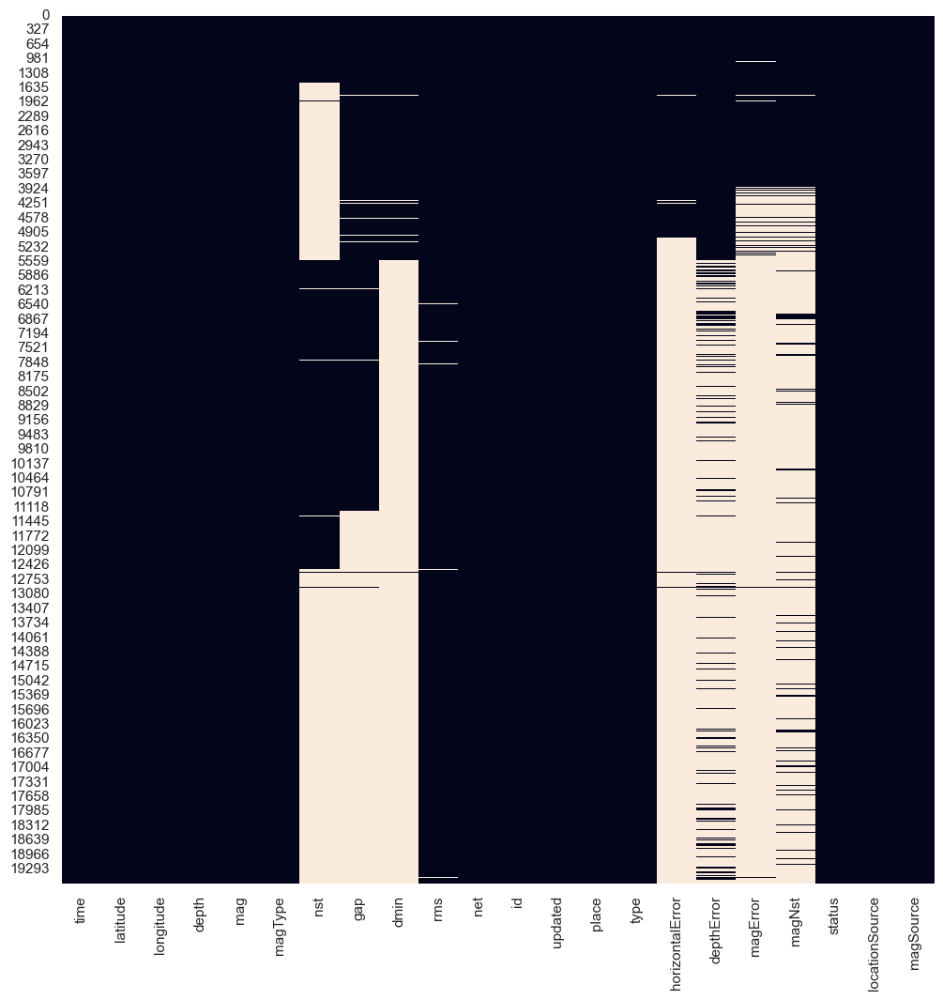

In [4]:
### (2.1.2) Quick look at missing value heatmap
sns.set(rc = {'figure.figsize':(12,12)})
sns.heatmap(data_df.isnull(), cbar=False)

In [5]:
### (2.1.3) Printing the first five rows
data_df.head(5)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2025-09-09T04:08:01.259Z,42.3696,-126.4413,13.843,5.8,mww,32.0,234.0,1.552,0.60,...,2025-09-09T14:04:09.139Z,"165 km WSW of Port Orford, Oregon",earthquake,8.68,14.320,0.026,142.0,reviewed,us,us
1,2025-09-08T21:47:48.065Z,-20.9809,173.7581,10.000,6.4,mww,64.0,104.0,5.176,1.03,...,2025-09-09T00:12:53.204Z,Vanuatu region,earthquake,7.98,1.870,0.043,53.0,reviewed,us,us
2,2025-09-04T16:56:25.441Z,34.7190,70.7909,10.000,5.6,mww,108.0,30.0,1.381,0.91,...,2025-09-06T01:17:40.873Z,"36 km WSW of Asadābād, Afghanistan",earthquake,5.87,2.599,0.069,20.0,reviewed,us,us
3,2025-09-04T04:10:18.014Z,-24.3833,-67.2005,176.483,5.9,mww,109.0,70.0,1.684,1.31,...,2025-09-08T01:58:06.791Z,"91 km WSW of San Antonio de los Cobres, Argentina",earthquake,8.35,7.242,0.037,71.0,reviewed,us,us
4,2025-09-03T20:57:46.971Z,52.3338,-169.6766,10.000,6.0,mww,105.0,60.0,0.812,0.73,...,2025-09-08T21:07:50.775Z,"87 km SW of Nikolski, Alaska",earthquake,7.15,1.836,0.045,48.0,reviewed,us,us


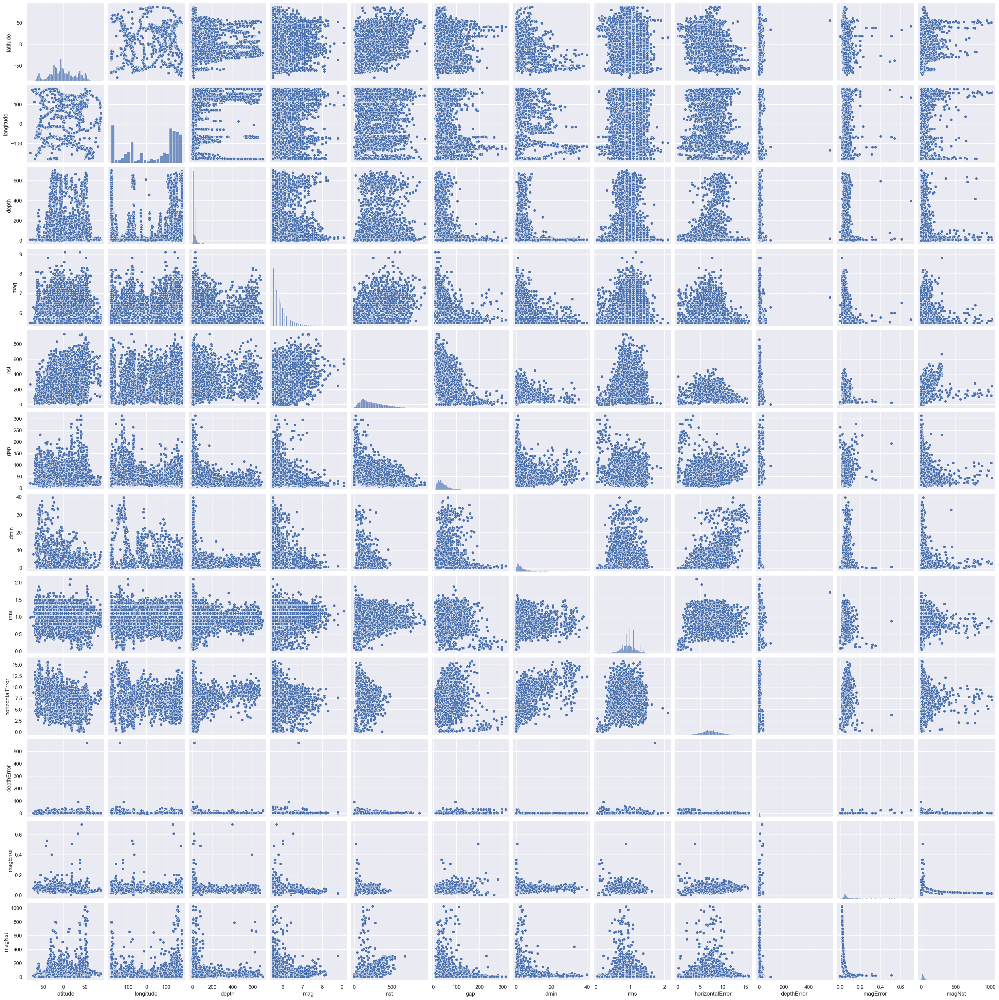

In [6]:
### (2.1.4) Plot the pairplot of numerical values
sns.pairplot(data=data_df)

In [7]:
### (2.1.5) Extracting the desired features
selected_df = data_df[['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'depthError', 'magError', 'id']]
selected_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19611 entries, 0 to 19610
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   time        19611 non-null  object 
 1   latitude    19611 non-null  float64
 2   longitude   19611 non-null  float64
 3   depth       19611 non-null  float64
 4   mag         19611 non-null  float64
 5   magType     19611 non-null  object 
 6   depthError  7803 non-null   float64
 7   magError    4196 non-null   float64
 8   id          19611 non-null  object 
dtypes: float64(6), object(3)
memory usage: 1.3+ MB


### 2.2 Data Cleaning
I divide this section to three parts; (1) handling missing data (divided to two parts, one for NaN values, the other for sentinel coded values like 999 for grades 0-100), (2) handling outliers, (3) correcting errors.

#### 2.2.1 Handling Missing Data

**2.2.1-1** Handling missing data (NaN values). It should be noted that the reason why data is missing is very important:
- They might lead to biased analysis and conclusion.
- We can identify potential issues with data collection process and data quality.
- We need to choose how to handle them (impute by .fillna() or remove by .dropna()) based on the reasons.

Common reasons include:
- **Structurally (justifiable)** missing data (e.g., pregnancy of men) $\rightarrow$ No need to do anything (ignore values), understanding them is enough!
- **Missing completely at random (MCAR)**, no pattern at missingness $\rightarrow$ No need to do anything (ignore values), although the assumption is potentially dangerous and data is rarely actually MCAR.
- **Missing at random (MAR)**, missingness depends on other variables (e.g., if girls do not tend to report their age, missingness depends on gender variable) $\rightarrow$ Data could potentially be predicted based on other complete observations.
- **Missing not at random** (e.g., a sensor stops recording data when too hot) $\rightarrow$ No need to do anything (ignore values), understanding them is enough!

Based on the **first** cell below, the results for checking the missing data is as follows:
- We can see that 79% of observations are missing a value for `magError`,and 60% for `depthError`.
- Although observations with many missing values are often dropped, 60% of data has two missing values, 18% has a single missing value, and the rest of data has no missing value.
- The correlation between missing data values is 0.64, indicating an intermediate to strong correlation between `depthError` and `magError`. Based on the heatmap plot created in section (2.1.2), since the data is ordered in time, it can be observed that `depthError` and `magError` both are missing typically for older measurements, which explains the high value of correlation. In other words, most of these values seem to be **Missing not at random**.


**2.2.1-2** Handling missing data (sentinel values), if any

Based on the **second** cell below, there is no sentinental code values indicating missing values:
- All the values are within or very close to the valid ranges `latitude`$\in[-90,90]$, `longitude`$\in[-180,180]$, `mag`&`'magError'$\in[5.5,9.1]$,  `depth`&`depthError`$\in[0.0, 752]$.
- There are only 5 negative depth values due to corrections. We replace these values by zero to represent being shallow while preserving robustness.

In [8]:
### (2.2.1.1) Handling missing data (NaN values)

# Print general useful information
print('Number of null values of each column:\n', selected_df.isnull().sum(), '\n')
print('Proportion of null values of each column:\n', selected_df.isnull().mean(), '\n')
print('The frequency distribution of the number of missing values per row:\n', selected_df.isnull().sum(axis='columns').value_counts(), '\n')
print('The relative frequency distribution of the number of missing values per row:\n',
      selected_df.isnull().sum(axis='columns').value_counts(normalize=True), '\n')

# Investigating any relationship between columns with missing values
data_null_corr = selected_df[['depthError', 'magError']].isnull().corr()
data_null_corr

Number of null values of each column:
 time              0
latitude          0
longitude         0
depth             0
mag               0
magType           0
depthError    11808
magError      15415
id                0
dtype: int64 

Proportion of null values of each column:
 time          0.000000
latitude      0.000000
longitude     0.000000
depth         0.000000
mag           0.000000
magType       0.000000
depthError    0.602111
magError      0.786038
id            0.000000
dtype: float64 

The frequency distribution of the number of missing values per row:
 2    11808
0     4196
1     3607
Name: count, dtype: int64 

The relative frequency distribution of the number of missing values per row:
 2    0.602111
0    0.213962
1    0.183927
Name: proportion, dtype: float64 



,depthError,magError
depthError,1.000000,0.641805
magError,0.641805,1.000000


In [9]:
### (2.2.1.2) Handling missing data (sentinel values)

# Print min and max values
print(selected_df.describe())
# print('The min values are:\n', selected_df.min())
# print('The min values are:\n', selected_df.max())

# Exploring negative depth values
filter_neg_depth = selected_df['depth']<0
print(f'\nThere are {filter_neg_depth.sum()} negative depth values:')

# Extract the index of negative values of depth with zero
neg_depth_inds = selected_df[filter_neg_depth].index

# Replace negative depth values with zero
for ind in neg_depth_inds:
    # print(ind)
    selected_df.loc[ind,'depth'] = 0.0
    
selected_df[filter_neg_depth]

           latitude     longitude         depth           mag   depthError  \
count  19611.000000  19611.000000  19611.000000  19611.000000  7803.000000   
mean      -0.304716     34.133754     70.084526      5.873906     3.785572   
std       30.164344    126.616341    127.873938      0.420868     7.636363   
min      -77.080000   -179.997000     -3.000000      5.500000     0.000000   
25%      -20.416000    -82.332100     10.000000      5.600000     1.800000   
50%       -4.387300     97.329000     30.000000      5.700000     1.900000   
75%       22.357000    143.795000     49.200000      6.000000     4.100000   
max       86.922900    179.998100    700.000000      9.100000   569.200000   

          magError  
count  4196.000000  
mean      0.058535  
std       0.028296  
min       0.000000  
25%       0.045000  
50%       0.055000  
75%       0.068000  
max       0.700000  

There are 5 negative depth values:


,time,latitude,longitude,depth,mag,magType,depthError,magError,id
12951,1999-05-27T08:09:11.060Z,59.366300,-139.0378,0.0,5.60,mw,22.80,NaN,ak9996r8tfqa
15932,1993-04-16T04:09:17.490Z,56.031800,-154.7147,0.0,5.50,mw,7.00,NaN,ak9934vdehk5
16344,1992-06-28T12:00:45.000Z,34.131000,-116.4080,0.0,5.77,ml,2.73,NaN,ci3043549
16345,1992-06-28T11:57:34.130Z,34.200000,-116.4370,0.0,7.30,mw,0.31,NaN,ci3031111
19162,1986-07-21T22:07:15.640Z,37.621333,-118.3425,0.0,5.60,ml,7.22,NaN,nc95459


#### 2.2.2 Handling Outliers
In this section, we handle outliers (identify and manage), if any. Based on the cell below:
- According to the visualization in (2.1.4), `depthError` and `magError` have outliers.
- To systematically detect outliers, statisticians leverage z-score approach (standard deviation method) in which the data is assumed to be roughly normal, and an observation is outlier if its z-score $|\frac{x-\mu}{\sigma}|>|3|$.
- Totally, there are 66 lines of data with outliers for `depthError` and `magError`. 3 of them are for both since there is 38 outliers for `depthError` and 31 outliers for `magError`. They are all removed since they are less than 0.1% of the total data and we do not want to have higher error values for magnitude and depth.


The number of outliers for column depthError is 38.

The number of outliers for column magError is 31.

The total number of outliers for all columns is 66.



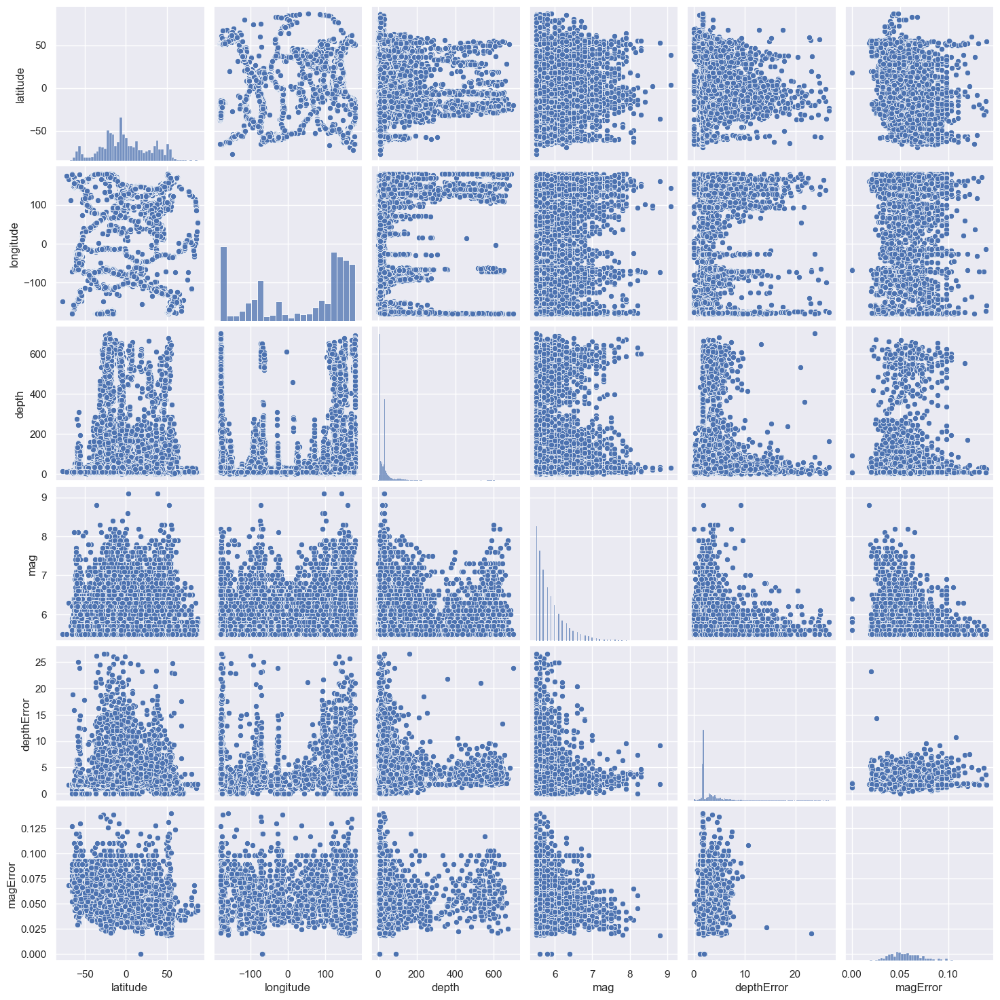

In [10]:
### (2.2.2) Handling outliers (selected_df -> df_no_outlier)

# Import the required function
from scipy.stats import zscore

## Define a function able to explore outliers for a specific column value
def outlier_info_detector(df, desired_col_str):

    # Extract the desired dataframe (columns of interest)
    desired_df = df.copy()[['id',desired_col_str]]

    # Drop all NaN values
    desired_df.dropna(inplace=True)

    # Calculate z-score
    desired_df['zScore'] = np.abs(zscore(desired_df[desired_col_str]))

    outliers = desired_df[desired_df['zScore']>3]
    print(f'The number of outliers for column {desired_col_str} is {len(outliers)}.\n')

    return outliers['id']


# Detect the outliers for 'depthError' and 'magError'
outliers_id_depthErr = outlier_info_detector(selected_df, 'depthError')
outliers_id_magErr = outlier_info_detector(selected_df, 'magError')

# Form the combined filter
outliers_id_combined = pd.concat([outliers_id_depthErr, outliers_id_magErr]).drop_duplicates()

# The total number of outliers    
print(f'The total number of outliers for all columns is {len(outliers_id_combined)}.\n')

# Remove the data based on 'depthError' outliers
filter_all_outliers = selected_df['id'].isin(outliers_id_combined)
df_no_outlier = selected_df[~filter_all_outliers]

# Plot the pairplot
sns.pairplot(df_no_outlier)

#### 2.2.3 Correcting Errors
In this section, we explore to see if there is any errors (inaccuracies, inconsistencies, and duplicates). Based on the cell below,
- There is no duplicated data, and there no inconsistency for `time`.
- There are 12 different `magType`. The majority (92%) of these types start with mw which shows that the corresponding `mag` value is computed using seismic moment. Other methods rely on amplitude, period, and so forth for computation.

In [11]:
### (2.2.3) Correcting errors
print(f'The number of duplicated data is {df_no_outlier.duplicated().sum()}.')

# Any out of range value for time
print(f'\nThere is {pd.to_datetime(df_no_outlier['time'], errors='coerce').isnull().sum()} number of out of range values for time.')

# Exploring the number of unique values
print('\nNumber of unique values:\n', df_no_outlier.nunique())

# Count unique values in magType
print('\nNumber of unique values for each value within magType:\n', df_no_outlier['magType'].value_counts())

The number of duplicated data is 0.

There is 0 number of out of range values for time.

Number of unique values:
 time          19545
latitude      18295
longitude     18620
depth          3942
mag              55
magType          12
depthError      933
magError        106
id            19545
dtype: int64

Number of unique values for each value within magType:
 magType
mww    5607
mwc    5587
mw     4332
mwb    2466
mb     1245
ms      228
ml       33
mwr      32
md        8
mwp       3
mh        3
Ml        1
Name: count, dtype: int64


### 2.3 Data Transformation
In this section, we encode categorical data into numerical formats. Based on the cell below:
- `magType` is replaced with `magTypeNum` in which a number from {0,1,...,11} is assigned for each `magType` in the order of frequecy. (0 refers to mww with 5607 repetitions, while 11 relates to Ml with 1 repetition)
- Features such as `year`, `month`, `day`, and `hour` are extracted from time column.
- All columns with type other than integer or decimal are removed.

<class 'pandas.core.indexes.base.Index'>
<class 'pandas.core.frame.DataFrame'>
Index: 19545 entries, 0 to 19610
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        19545 non-null  int32  
 1   month       19545 non-null  int32  
 2   day         19545 non-null  int32  
 3   latitude    19545 non-null  float64
 4   longitude   19545 non-null  float64
 5   depth       19545 non-null  float64
 6   mag         19545 non-null  float64
 7   depthError  7737 non-null   float64
 8   magError    4162 non-null   float64
 9   magTypeNum  19545 non-null  int32  
dtypes: float64(6), int32(4)
memory usage: 1.3 MB


,year,month,day,latitude,longitude,depth,mag,depthError,magError,magTypeNum
0,2025,9,9,42.3696,-126.4413,13.843,5.8,14.320,0.026,0
1,2025,9,8,-20.9809,173.7581,10.000,6.4,1.870,0.043,0
2,2025,9,4,34.7190,70.7909,10.000,5.6,2.599,0.069,0
3,2025,9,4,-24.3833,-67.2005,176.483,5.9,7.242,0.037,0
4,2025,9,3,52.3338,-169.6766,10.000,6.0,1.836,0.045,0
...,...,...,...,...,...,...,...,...,...,...
19606,1985,8,12,-38.3780,-73.4950,33.000,6.2,NaN,NaN,2
19607,1985,8,11,54.1390,168.7310,50.400,6.3,NaN,NaN,2
19608,1985,8,11,11.1560,140.2170,24.000,6.1,NaN,NaN,2
19609,1985,8,10,-4.2490,152.8770,32.000,5.7,NaN,NaN,2


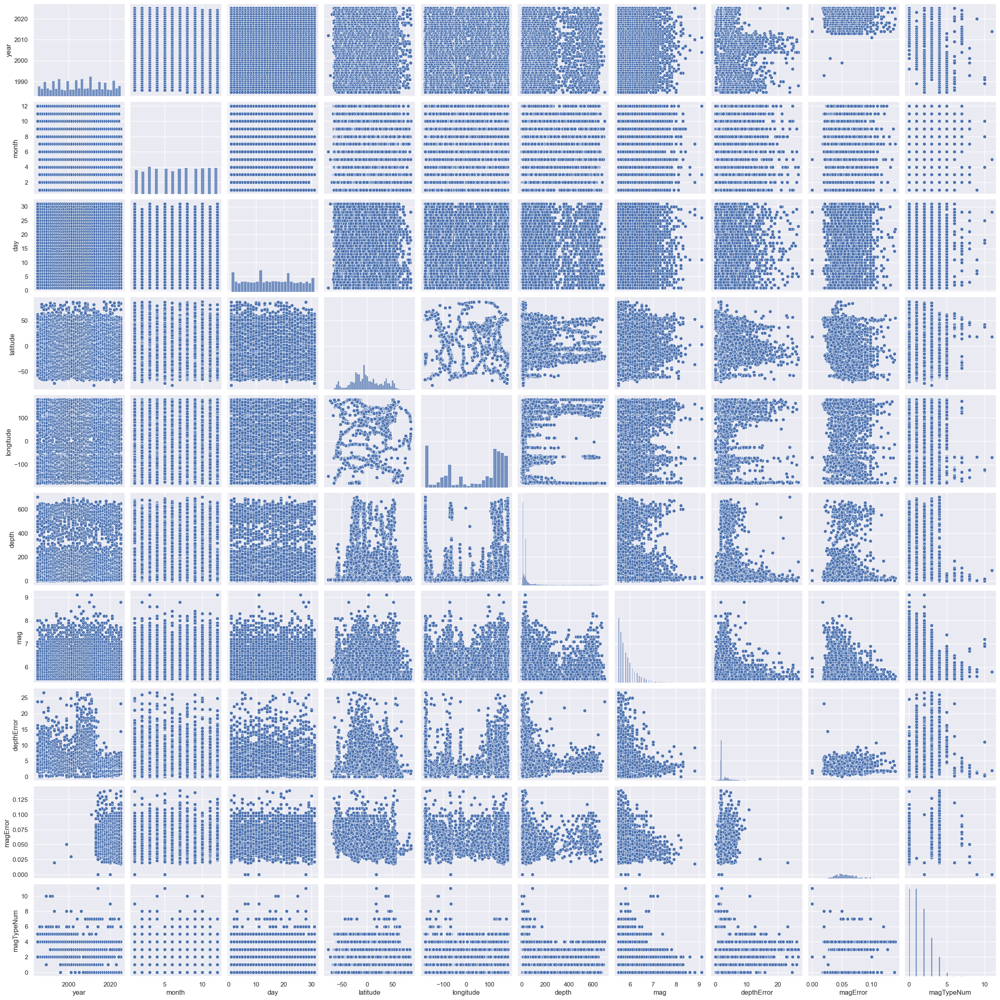

In [12]:
### (2.3) Data Transformation
pd.set_option('future.no_silent_downcasting', True)
# Form the final dataframe after preprocessing and before EDA
df_all_numeric = df_no_outlier.copy()

# Print the type of index
print(type(df_all_numeric.index))

# Create a mapping dictionary in the order of frequency for unique values of magType
mapping_dict = {'mww':0, 'mwc':1, 'mw':2, 'mwb':3, 'mb':4, 'ms':5, 'ml':6, 'mwr':7, 'md':8, 'mwp':9, 'mh':10, 'Ml':11}

# Encode categorical data into
df_all_numeric['magTypeNum'] = df_all_numeric['magType'].replace(mapping_dict).astype('int')

# Turn the time to year, season, month, day, hour
df_all_numeric['new_time'] = pd.to_datetime(df_all_numeric['time'])
df_all_numeric['year'] = df_all_numeric['new_time'].dt.year
df_all_numeric['month'] = df_all_numeric['new_time'].dt.month
df_all_numeric['day'] = df_all_numeric['new_time'].dt.day

# Drop excessive columns
df_all_numeric.drop(labels=['id', 'magType', 'time', 'new_time'], axis=1, inplace=True)

# Set the new order of columns
new_col_order = ['year', 'month', 'day', 'latitude', 'longitude', 'depth', 'mag', 'depthError', 'magError', 'magTypeNum']
df_all_numeric = df_all_numeric[new_col_order]

sns.pairplot(df_all_numeric)

df_all_numeric.info()
df_all_numeric

## **3. EDA & Visualizations**
In this section, we explore the potential relationships in three categories:

3.1 Depth-magnitude structure

3.2 Detecting patterns across time

3.3 Features shown on world map

In [13]:
# Set global plot style
plt.rcParams.update({
    "font.family": "serif",          # Or "sans-serif"
    "font.serif": ["Times New Roman", "Palatino", "Computer Modern"],
    "font.size": 14,                 # Base font size
    "axes.titlesize": 16,            # Title font size
    "axes.labelsize": 15,            # Axis label size
    "xtick.labelsize": 13,           # Tick label sizes
    "ytick.labelsize": 13,
    "legend.fontsize": 12,
    "legend.title_fontsize": 12,
    "axes.linewidth": 1.3,
    "axes.labelpad": 8,
    "axes.titlepad": 12,
    "lines.linewidth": 2,
    "lines.markersize": 6,
    "grid.alpha": 0.4,
    "grid.linewidth": 0.8,
    "savefig.dpi": 300,
    "savefig.bbox": "tight"
})

sns.set_context("paper", font_scale=1.3)
sns.set_style("whitegrid", {
    'axes.grid': True,
    'grid.linestyle': ':',
    'grid.linewidth': 0.7,
    'axes.edgecolor': '0.8',
})

### 3.1 Depth-magnitude structure
- In the last forty years, 90% of earthquakes with intensity higher than 5.5 have depth less than 163km. To be more specific, if we assume that there are three levels of depth for earthquakes based on [Wikipedia](https://en.wikipedia.org/wiki/Depth_of_focus_(tectonics)#:~:text=In%20seismology%2C%20the%20depth%20of,%2C%20along%20Wadati%E2%80%93Benioff%20zones.), shallow with depth<70km, intermediate with 70<depth<300, and deep with depth>300km, about 80% of them are shallow, about 14% are intermediate, and only 6% of these earthquakes are considered to be deep. This is also evident from the kde plot shown for depth.
- The left skewed kde plot of magnitude also indicates that earthquake with lower values around 5.9 are more common that the ones with higher intensity. This verifies the Gutenberg–Richter law which says small-to-moderate earthquakes occur far more frequently than very large ones. It should be noted that the dataset used in this project only includes earthquakes with magnitudes larger than 5.5. Also, there are very few earthquakes with magnitude larger than 8, which is expected since great earthquakes are rare.
- In terms of the joint behavior of magnitude and depth, there is no ascending or descending visible trend (no strong correlation). Nevertheless, the majority of earthquake motions with magnitude larger than 7.5 occur in shallower depths.

               mag         depth
count  19545.00000  19545.000000
mean       5.87405     70.212143
std        0.42080    127.976962
min        5.50000      0.000000
25%        5.60000     10.000000
50%        5.70000     30.000000
75%        6.00000     49.500000
80%        6.10000     68.000000
90%        6.40000    163.360000
93.8%      6.60000    302.322240
max        9.10000    700.000000


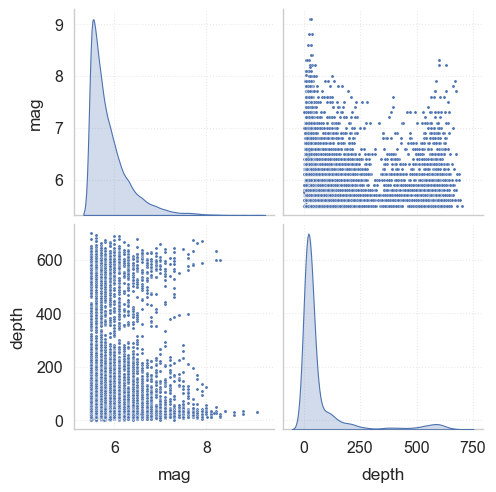

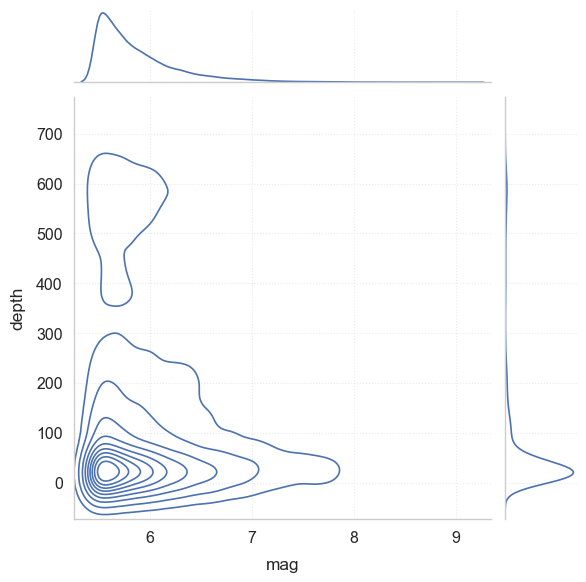

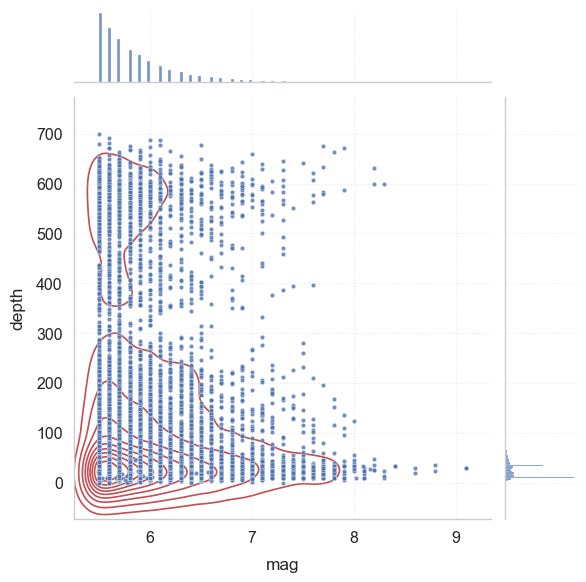

In [14]:
# Form a new dataframe for this section 3.1
df31 = df_all_numeric[['mag', 'depth', 'depthError', 'magError', 'magTypeNum']]

# Plot the pairplot to capture any relationship between variables mag and depth
sns.pairplot(df31[['mag', 'depth']], diag_kind="kde", plot_kws={'s':5})
sns.jointplot(df31, x= 'mag', y='depth', kind='kde')
g = sns.jointplot(data=df31, x= 'mag', y='depth', s=10, alpha=0.8)
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10)

# Explore statistical features of variables mag and depth
print(df31[['mag', 'depth']].describe(percentiles=[0.25, 0.5, 0.75, 0.8, 0.9, 0.938]))

### 3.2 Detecting pattern across time
- There is no ascending or descending trend over years. During last 40 years, there is only one year for which there were less than 350 earthquakes, and there is only one year for which there were more than 700 ground motions. In most of the time, we expect between 450 and 550 number of earthquakes.
- Over different years, the highest correlation between frequency (count) of earthquake and statistical features of magnitude and depth is among the frequency and maximum magnitude with weak to moderate correlation of 0.42. In other words, the higher the magnitude of earthquakes in a year, the more earthquake will happen potentially due to higher tectonic activities.

<Axes: title={'center': 'Trend of earthquake (mag>5.5) frequencies over last 40 years'}, xlabel='year'>

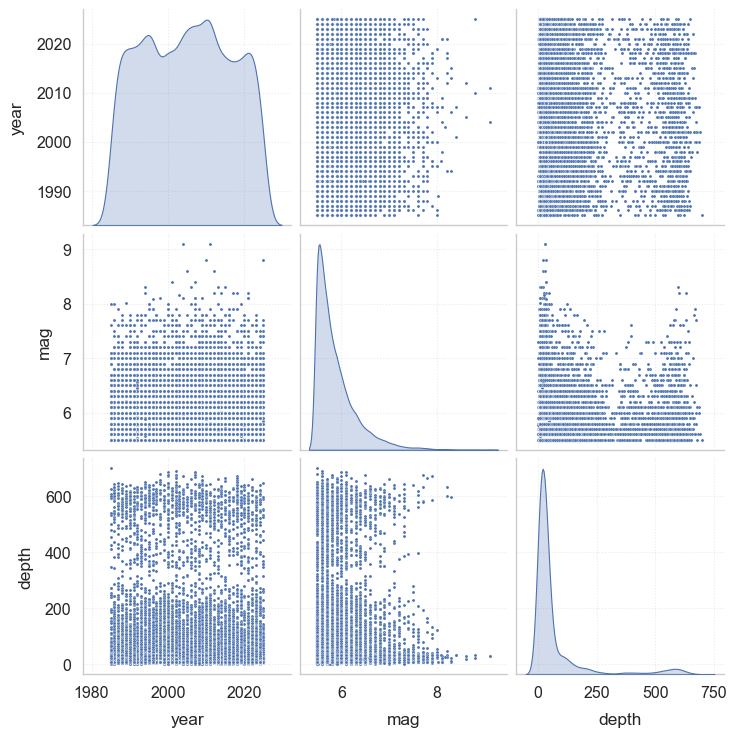

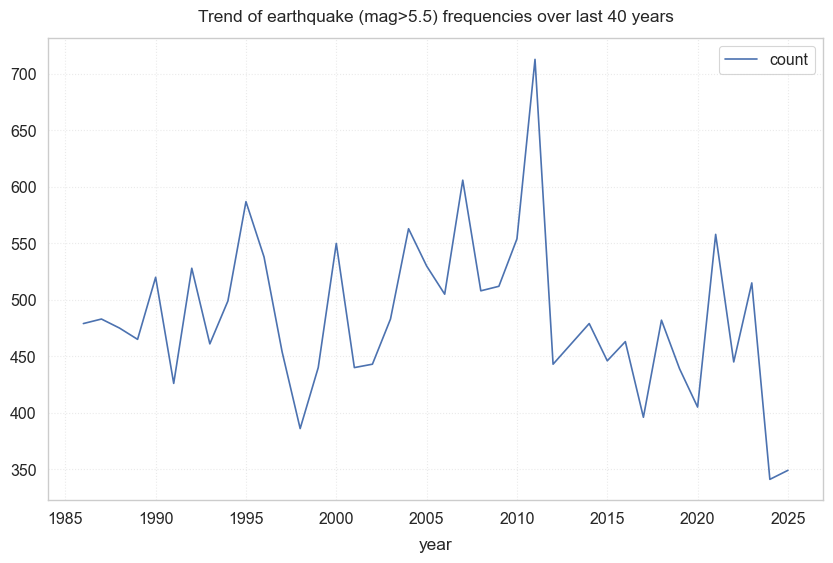

In [15]:
# Form a new dataframe for this section 3.2
df32 = df_all_numeric[['year', 'mag', 'depth']]

# Plot the pairplot to capture any relationship between variables mag and depth
sns.pairplot(df32[['year', 'mag', 'depth']], diag_kind="kde", plot_kws={'s':5})

# Count the number of earthquakes in each year
df32_grouped_by_year = df32.groupby('year').agg({'mag':['count', 'mean', 'min', 'max'], 'depth':['mean', 'min', 'max']})

# Rename the column names
df32_grouped_by_year.columns = ['count', 'mag_mean', 'mag_min', 'mag_max', 'depth_mean', 'depth_min', 'depth_max']

df32_grouped_by_year
# Remove the first year since it is only from Sep. to Dec.
df32_grouped_by_year.drop(labels=1985, inplace=True)

# Plot the trend of earthquake frequencies over years
df32_grouped_by_year.plot(kind='line', y='count', figsize=(10,6),
                          title='Trend of earthquake (mag>5.5) frequencies over last 40 years')

<Axes: title={'center': 'Trend of average, min and max of earthquake depths over last 40 years'}, xlabel='year'>

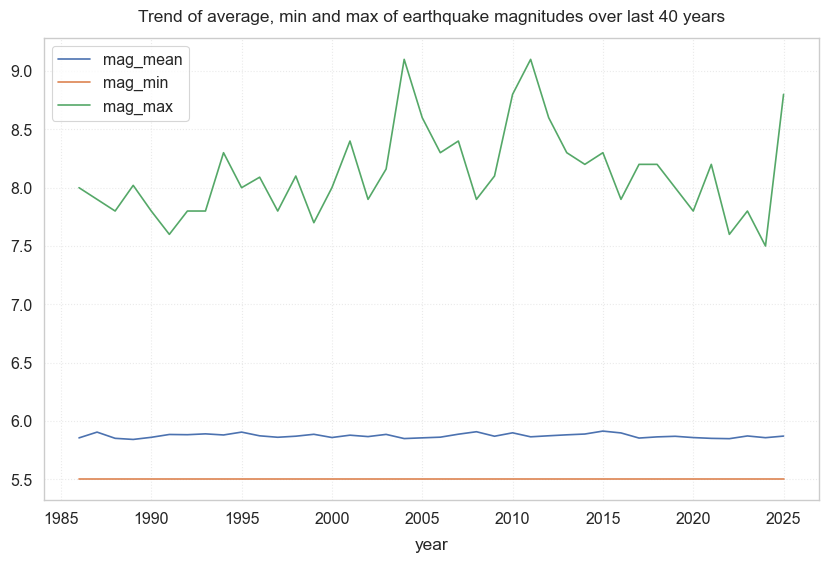

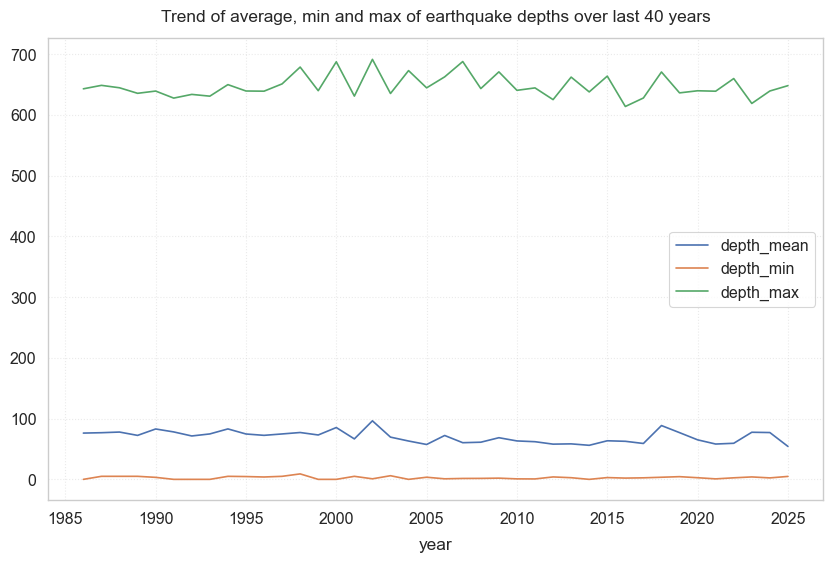

In [16]:
# the trend of earthquake magnitude and depth over years
df32_grouped_by_year[['mag_mean', 'mag_min', 'mag_max']].plot(kind='line', figsize=(10,6),
                                                              title='Trend of average, min and max of earthquake magnitudes over last 40 years')
df32_grouped_by_year[['depth_mean', 'depth_min', 'depth_max']].plot(kind='line', figsize=(10,6),
                                                                    title='Trend of average, min and max of earthquake depths over last 40 years')

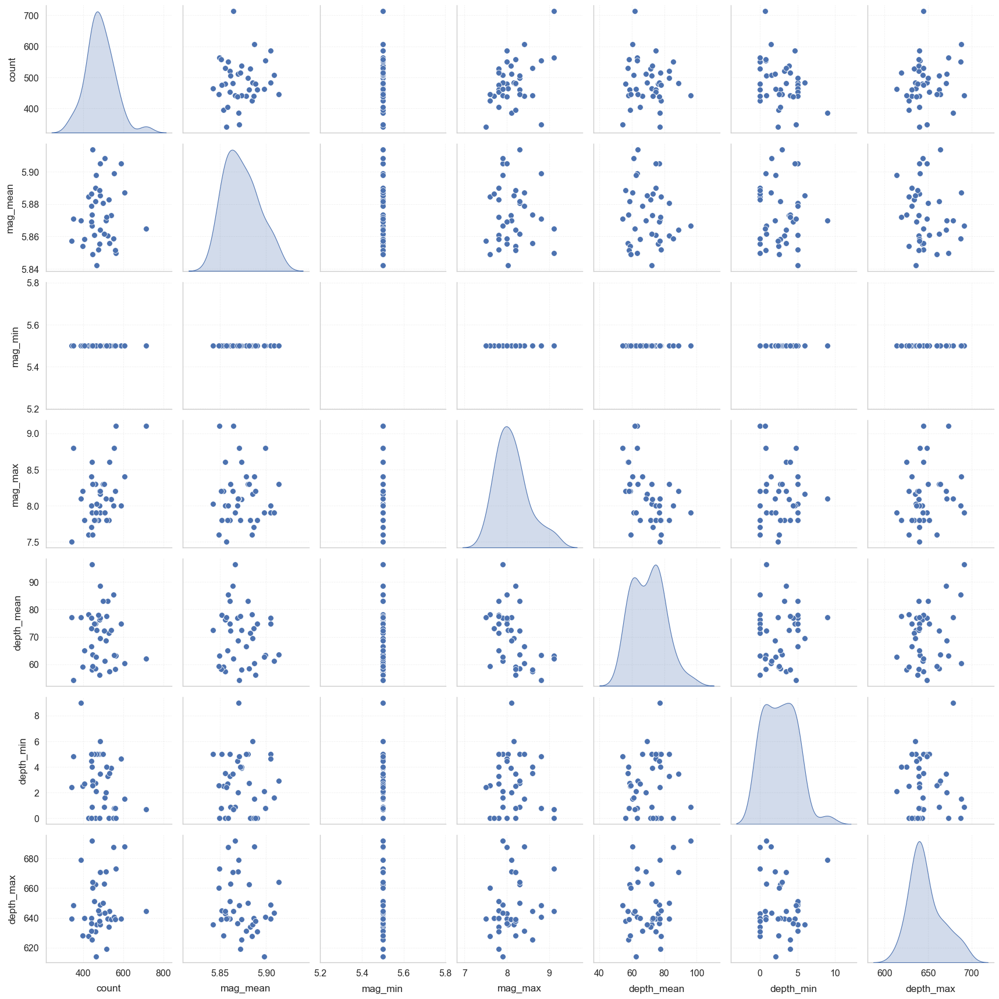

In [17]:
# Plot the pairplot
sns.pairplot(df32_grouped_by_year, diag_kind="kde", plot_kws={'s':50})

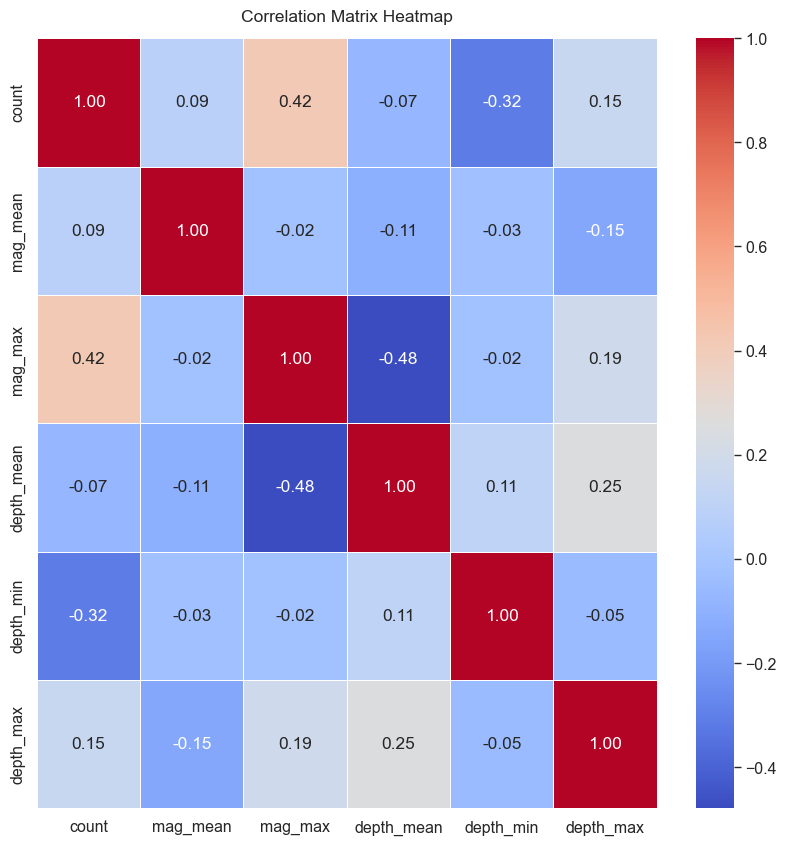

,count,mag_mean,mag_max,depth_mean,depth_min,depth_max
count,1.000000,0.086694,0.420610,-0.073567,-0.316188,0.145316
mag_mean,0.086694,1.000000,-0.017071,-0.108651,-0.026447,-0.146196
mag_max,0.420610,-0.017071,1.000000,-0.478819,-0.019654,0.185323
depth_mean,-0.073567,-0.108651,-0.478819,1.000000,0.108228,0.251306
depth_min,-0.316188,-0.026447,-0.019654,0.108228,1.000000,-0.052879
depth_max,0.145316,-0.146196,0.185323,0.251306,-0.052879,1.000000


In [18]:
# Compute the correlation plot over years among six of the features
df32_grouped_by_year_corr = df32_grouped_by_year[['count', 'mag_mean', 'mag_max', 'depth_mean', 'depth_min', 'depth_max']].corr()

# Plot the heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df32_grouped_by_year_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

df32_grouped_by_year_corr

### 3.3 Features shown on world map
- From the **first** cell below, it is evident that deeper earthquakes happen mostly in West South America, East Asia, and East Australia. The highest errors in depth calculation also happens in Pacific Ocean (East Asia and East Australia), for which much fewer stations exist.
- In terms of magnitude, the eathquakes with highest magnitude during the last 40 years often locate in SouthAsia, East Asia, South Australia, East South America, or West North America.

In [19]:
### (3.3) Features shown on an interactive world map
# Plot depth and depthError on the world map
fig = px.scatter_geo(
    df_all_numeric,
    lat='latitude',
    lon='longitude',
    color='depthError',
    size='depth',
    color_continuous_scale='Turbo',
    projection='natural earth',
    opacity=0.6,
    hover_data={'year': True, 'depth': True, 'mag': ':.1f'})
fig.update_layout(title='Earthquakes (M≥5.5) – last 40 years')
fig.show()

In [20]:
### (3.3) Features shown on an interactive world map

# Create a new dataframe with a new scaled column for magnitude (linearly scaled for better size vizualization, 5.5~9.3 -> 1~1e5)
df_all_numeric_new = df_all_numeric.copy()

old_min, old_max = df_all_numeric_new['mag'].min(), df_all_numeric_new['mag'].max()
new_min, new_max = 1, 10000

df_all_numeric_new['mag_scaled'] = ((df_all_numeric_new['mag'] - old_min) / (old_max - old_min)) * (new_max - new_min) + new_min

# Plot magnitude and the new scaled value on the world map
fig = px.scatter_geo(
    df_all_numeric_new,
    lat='latitude',
    lon='longitude',
    color='mag',
    size='mag_scaled',
    color_continuous_scale='Turbo',
    projection='natural earth',
    opacity=0.5,
    hover_data={'year': True, 'depth': True, 'mag': ':.1f', 'mag_scaled': ':.1f'})
fig.update_layout(title='Earthquakes (M≥5.5) – last 40 years')
fig.show()